In [183]:
import os
import cv2
import torch
import skimage
import numpy as np
import torch.nn as nn
from PIL import Image
from model import UNet
from astropy.io import fits
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from skimage import exposure, filters


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [161]:
model = UNet(1, 5, 1, False, False)
state = torch.load('/Users/reza/Career/DMLab/DKIST/frontiers_repo/model_params/unet_epoch_12_0.52334_IoU_non_Dropout.pt', map_location=device)
# state = torch.load('/Users/reza/Career/DMLab/DKIST/frontiers_repo/model_params/unet_epoch_199_13.23084_FL_nonDp_g10.pt', map_location=device)
model.load_state_dict(state)

<All keys matched successfully>

## imax

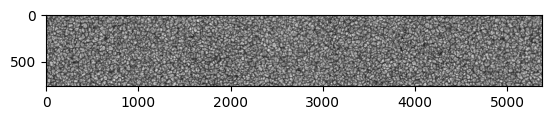

In [184]:
refs = np.zeros((768, 7*768), np.float32)
for i, imax in enumerate(os.listdir('/Users/reza/Career/DMLab/DKIST/frontiers_repo/data/Masks_S_v5/Train')):
    ref = np.load(os.path.join('/Users/reza/Career/DMLab/DKIST/frontiers_repo/data/Masks_S_v5/Train', imax))
    ref = ref['smap'].astype(np.float32)
    refs[:, i*768:(i+1)*768] = ref
reference = refs
plt.imshow(reference, cmap='gray')

# Dkist

## 1

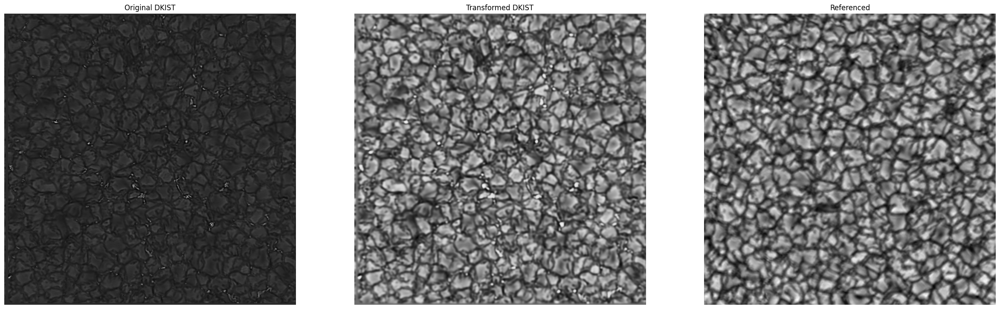

In [187]:
hdul = fits.open(
    '/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T17_46_29_333_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

reference_sharpness = np.var(filters.laplace(reference))
target_sharpness = np.var(filters.laplace(x))
sigma = np.sqrt(target_sharpness / reference_sharpness)

matched = filters.gaussian(x, sigma=sigma) # matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

matched /= np.max(matched)

ref = reference[:, :768] / np.max(reference[:, :768])
fig, axs = plt.subplots(1, 3, figsize=(30, 15))

# Plot the original image
axs[0].imshow(x, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original DKIST')


axs[1].imshow(matched, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Transformed DKIST')


axs[2].imshow(ref, cmap='gray')
axs[2].set_title('Referenced')
axs[2].axis('off')

plt.show()


## 2

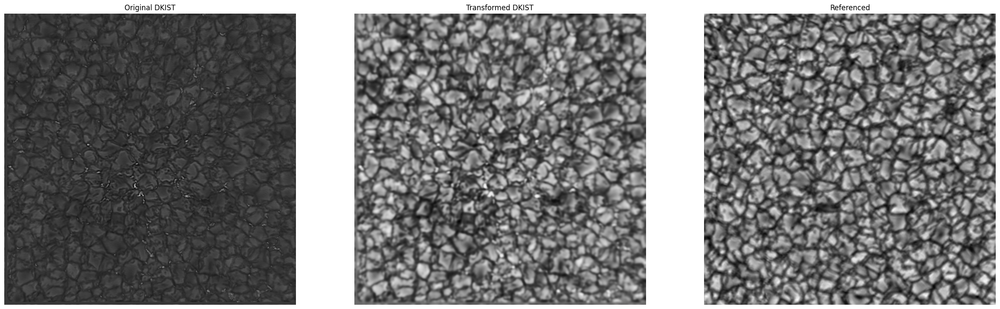

In [169]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T17_48_31_200_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

matched /= np.max(matched)

ref = reference[:, :768] / np.max(reference[:, :768])
fig, axs = plt.subplots(1, 3, figsize=(30, 15))

# Plot the original image
axs[0].imshow(x, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original DKIST')


axs[1].imshow(matched, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Transformed DKIST')


axs[2].imshow(ref, cmap='gray')
axs[2].set_title('Referenced')
axs[2].axis('off')

plt.show()

## 3

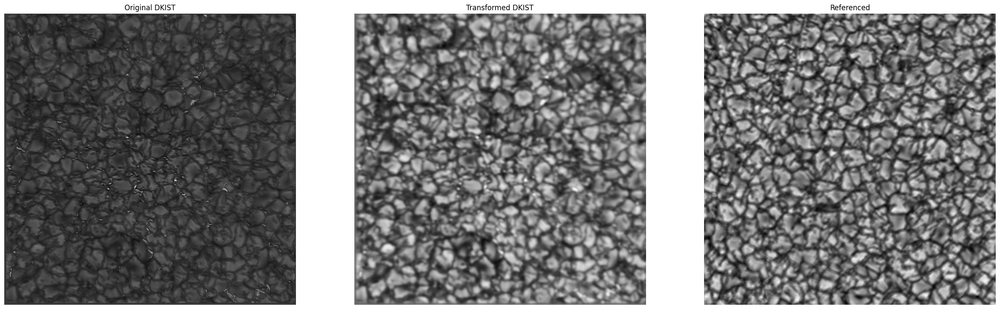

In [170]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T17_53_35_866_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

matched /= np.max(matched)

ref = reference[:, :768] / np.max(reference[:, :768])
fig, axs = plt.subplots(1, 3, figsize=(30, 15))

# Plot the original image
axs[0].imshow(x, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original DKIST')


axs[1].imshow(matched, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Transformed DKIST')


axs[2].imshow(ref, cmap='gray')
axs[2].set_title('Referenced')
axs[2].axis('off')

plt.show()

## 4

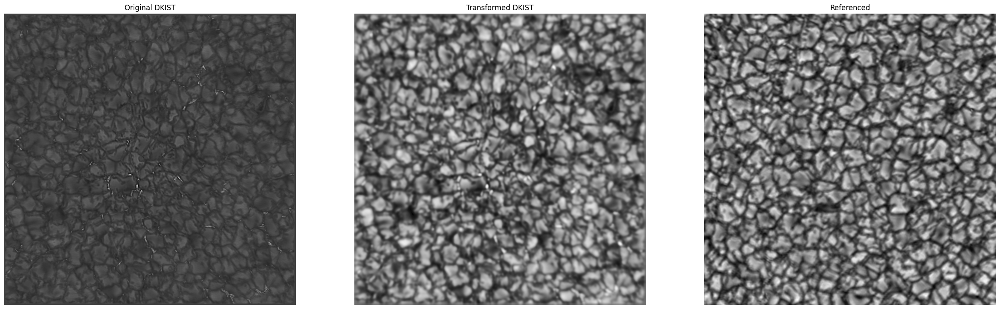

In [171]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T17_59_53_653_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

matched /= np.max(matched)

ref = reference[:, :768] / np.max(reference[:, :768])
fig, axs = plt.subplots(1, 3, figsize=(30, 15))

# Plot the original image
axs[0].imshow(x, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original DKIST')


axs[1].imshow(matched, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Transformed DKIST')


axs[2].imshow(ref, cmap='gray')
axs[2].set_title('Referenced')
axs[2].axis('off')

plt.show()

## 5

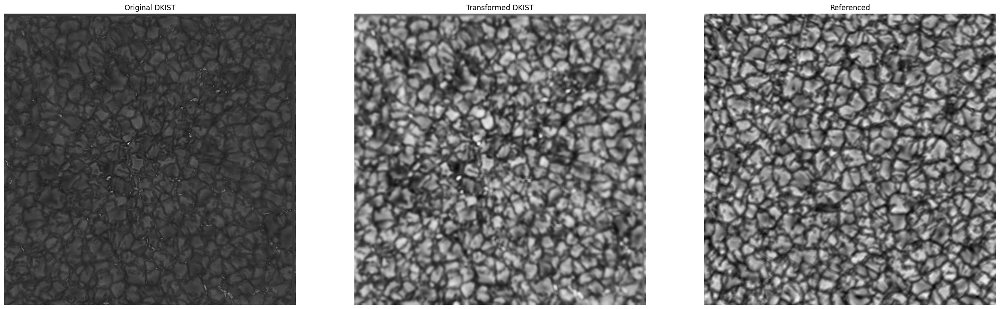

In [182]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T18_04_46_133_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

matched = cv2.GaussianBlur(x, (9, 9), gx, gy)
matched = exposure.match_histograms(matched, reference)

matched /= np.max(matched)

ref = reference[:, :768] / np.max(reference[:, :768])
fig, axs = plt.subplots(1, 3, figsize=(30, 15))

# Plot the original image
axs[0].imshow(x, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original DKIST')


axs[1].imshow(matched, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Transformed DKIST')


axs[2].imshow(ref, cmap='gray')
axs[2].set_title('Referenced')
axs[2].axis('off')

plt.show()

## 6

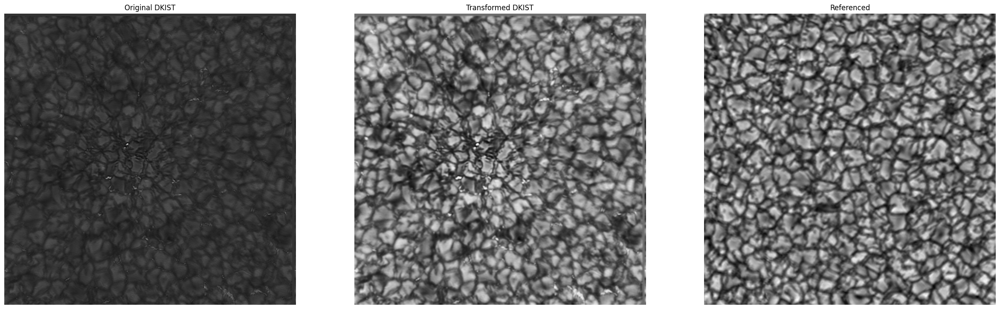

In [175]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T18_06_41_906_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

matched = cv2.GaussianBlur(x, (7, 7), 0)
matched = exposure.match_histograms(matched, reference)

matched /= np.max(matched)

ref = reference[:, :768] / np.max(reference[:, :768])
fig, axs = plt.subplots(1, 3, figsize=(30, 15))

# Plot the original image
axs[0].imshow(x, cmap='gray')
axs[0].axis('off')
axs[0].set_title('Original DKIST')


axs[1].imshow(matched, cmap='gray')
axs[1].axis('off')
axs[1].set_title('Transformed DKIST')


axs[2].imshow(ref, cmap='gray')
axs[2].set_title('Referenced')
axs[2].axis('off')

plt.show()

## 1

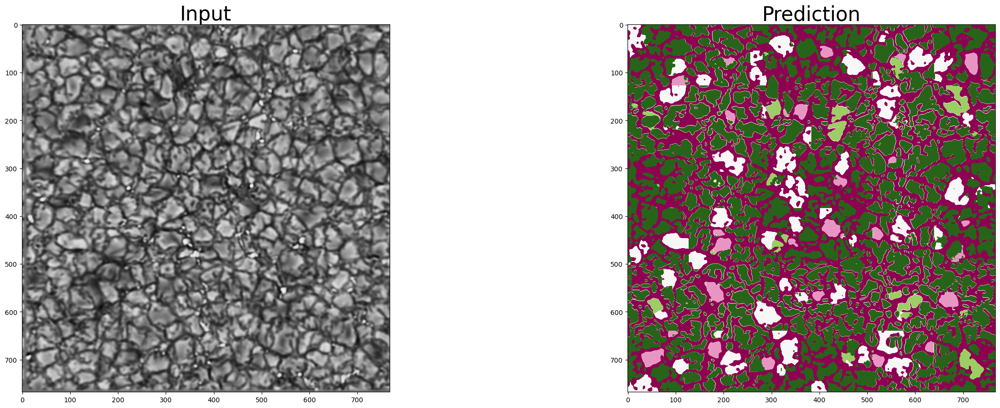

In [189]:
hdul = fits.open(
    '/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T17_46_29_333_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

reference_sharpness = np.var(filters.laplace(reference))
target_sharpness = np.var(filters.laplace(x))
sigma = np.sqrt(target_sharpness / reference_sharpness)

matched = filters.gaussian(x, sigma=sigma) # matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

x = matched / np.max(matched)

size = 128
dx = []

for i in range(6):
    for j in range(6):
        dx.append(x[i*128:(i+1)*128, j*128:(j+1)*128])
dx = np.array(dx)
dx = np.expand_dims(dx, axis=1)
# print(np.unique(dx))
xx = torch.Tensor(dx)
model.eval()

with torch.no_grad():
    pred_mask = model(xx.to(device))
pred_mask_np = pred_mask.cpu().detach().numpy()
pred_mask_class = torch.argmax(pred_mask, axis=1)
pred_mask_class_np = pred_mask_class.cpu().detach().numpy()
yhat = np.zeros((768, 768), dtype=np.int32)

for i in range(6):
    for j in range(6):
        yhat[i*128:(i+1)*128, j*128:(j+1)*128] = pred_mask_class_np[i*6+j]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.title('Input', fontsize=30)
plt.imshow(x, cmap='gray')
plt.subplot(1, 2, 2)
plt.title('Prediction', fontsize=30)
plt.imshow(yhat, cmap=plt.get_cmap('PiYG', 5))

## 2

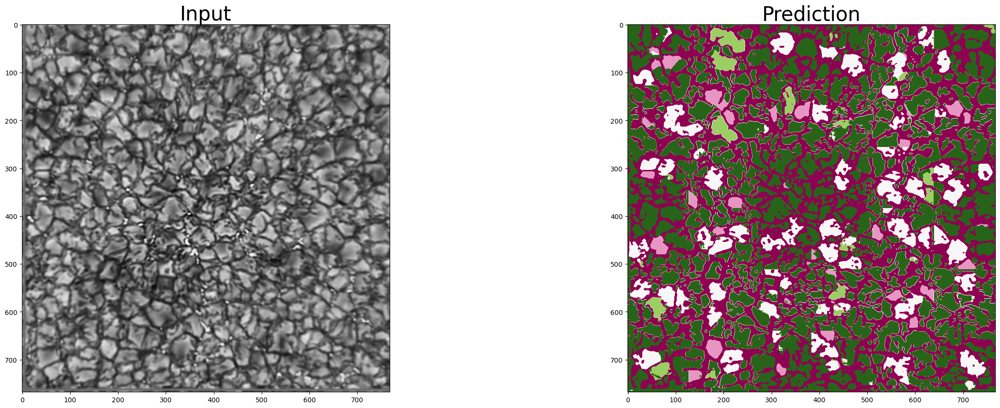

In [190]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T17_48_31_200_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

reference_sharpness = np.var(filters.laplace(reference))
target_sharpness = np.var(filters.laplace(x))
sigma = np.sqrt(target_sharpness / reference_sharpness)

matched = filters.gaussian(x, sigma=sigma) # matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

x = matched / np.max(matched)


size = 128
dx=[]

for i in range(6):
    for j in range(6):
        dx.append(x[i*128:(i+1)*128, j*128:(j+1)*128])
dx=np.array(dx)
dx=np.expand_dims(dx, axis=1)
xx = torch.Tensor(dx)
model.eval()

with torch.no_grad():
    pred_mask = model(xx.to(device))
pred_mask_np = pred_mask.cpu().detach().numpy()
pred_mask_class = torch.argmax(pred_mask, axis=1)
pred_mask_class_np=pred_mask_class.cpu().detach().numpy()
yhat = np.zeros((768, 768), dtype=np.int32)

for i in range(6):
    for j in range(6):
        yhat[i*128:(i+1)*128, j*128:(j+1)*128] = pred_mask_class_np[i*6+j]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.title('Input', fontsize=30)
plt.imshow(x, cmap='gray')
plt.subplot(1, 2, 2)
plt.title('Prediction', fontsize=30)
plt.imshow(yhat, cmap=plt.get_cmap('PiYG', 5))

## 3

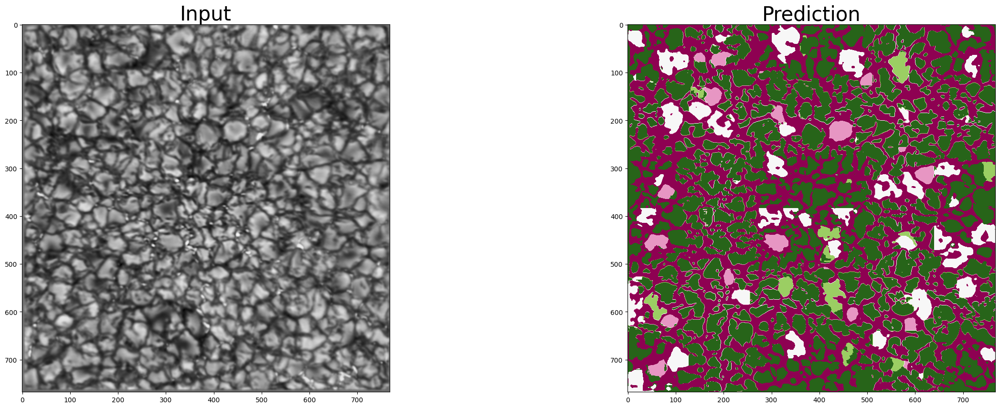

In [191]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T17_53_35_866_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

reference_sharpness = np.var(filters.laplace(reference))
target_sharpness = np.var(filters.laplace(x))
sigma = np.sqrt(target_sharpness / reference_sharpness)

matched = filters.gaussian(x, sigma=sigma) # matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

x = matched / np.max(matched)


size = 128
dx=[]

for i in range(6):
    for j in range(6):
        dx.append(x[i*128:(i+1)*128, j*128:(j+1)*128])
dx=np.array(dx)
dx=np.expand_dims(dx, axis=1)
xx = torch.Tensor(dx)
model.eval()

with torch.no_grad():
    pred_mask = model(xx.to(device))
pred_mask_np = pred_mask.cpu().detach().numpy()
pred_mask_class = torch.argmax(pred_mask, axis=1)
pred_mask_class_np=pred_mask_class.cpu().detach().numpy()
yhat = np.zeros((768, 768), dtype=np.int32)

for i in range(6):
    for j in range(6):
        yhat[i*128:(i+1)*128, j*128:(j+1)*128] = pred_mask_class_np[i*6+j]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.title('Input', fontsize=30)
plt.imshow(x, cmap='gray')
plt.subplot(1, 2, 2)
plt.title('Prediction', fontsize=30)
plt.imshow(yhat, cmap=plt.get_cmap('PiYG', 5))

## 4

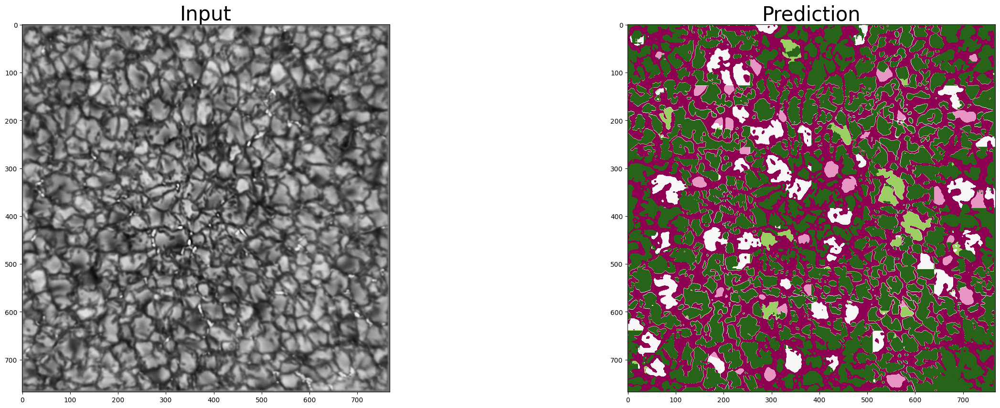

In [192]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T17_59_53_653_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

reference_sharpness = np.var(filters.laplace(reference))
target_sharpness = np.var(filters.laplace(x))
sigma = np.sqrt(target_sharpness / reference_sharpness)

matched = filters.gaussian(x, sigma=sigma) # matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

x = matched / np.max(matched)



size = 128
dx=[]

for i in range(6):
    for j in range(6):
        dx.append(x[i*128:(i+1)*128, j*128:(j+1)*128])
dx=np.array(dx)
dx=np.expand_dims(dx, axis=1)
xx = torch.Tensor(dx)
model.eval()

with torch.no_grad():
    pred_mask = model(xx.to(device))
pred_mask_np = pred_mask.cpu().detach().numpy()
pred_mask_class = torch.argmax(pred_mask, axis=1)
pred_mask_class_np=pred_mask_class.cpu().detach().numpy()
yhat = np.zeros((768, 768), dtype=np.int32)

for i in range(6):
    for j in range(6):
        yhat[i*128:(i+1)*128, j*128:(j+1)*128] = pred_mask_class_np[i*6+j]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.title('Input', fontsize=30)
plt.imshow(x, cmap='gray')
plt.subplot(1, 2, 2)
plt.title('Prediction', fontsize=30)
plt.imshow(yhat, cmap=plt.get_cmap('PiYG', 5))

## 5

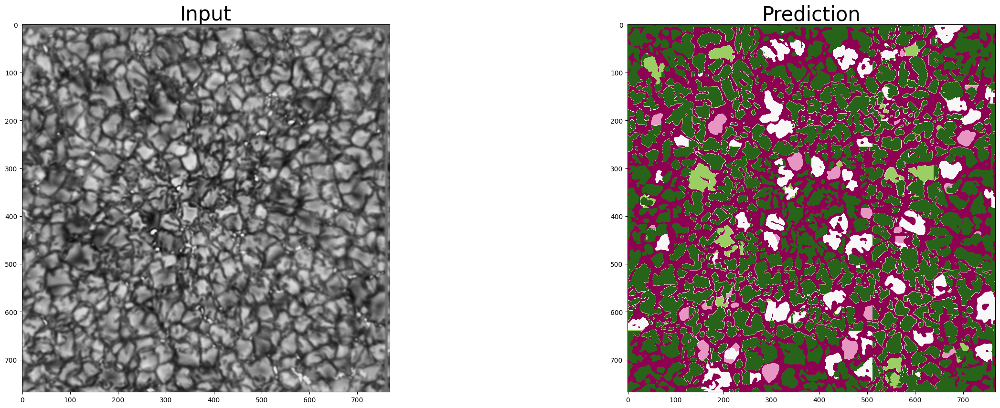

In [193]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T18_04_46_133_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

reference_sharpness = np.var(filters.laplace(reference))
target_sharpness = np.var(filters.laplace(x))
sigma = np.sqrt(target_sharpness / reference_sharpness)

matched = filters.gaussian(x, sigma=sigma) # matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

x = matched / np.max(matched)


size = 128
dx=[]

for i in range(6):
    for j in range(6):
        dx.append(x[i*128:(i+1)*128, j*128:(j+1)*128])
dx=np.array(dx)
dx=np.expand_dims(dx, axis=1)
xx = torch.Tensor(dx)
model.eval()

with torch.no_grad():
    pred_mask = model(xx.to(device))
pred_mask_np = pred_mask.cpu().detach().numpy()
pred_mask_class = torch.argmax(pred_mask, axis=1)
pred_mask_class_np=pred_mask_class.cpu().detach().numpy()
yhat = np.zeros((768, 768), dtype=np.int32)

for i in range(6):
    for j in range(6):
        yhat[i*128:(i+1)*128, j*128:(j+1)*128] = pred_mask_class_np[i*6+j]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.title('Input', fontsize=30)
plt.imshow(x, cmap='gray')
plt.subplot(1, 2, 2)
plt.title('Prediction', fontsize=30)
plt.imshow(yhat, cmap=plt.get_cmap('PiYG', 5))

## 6

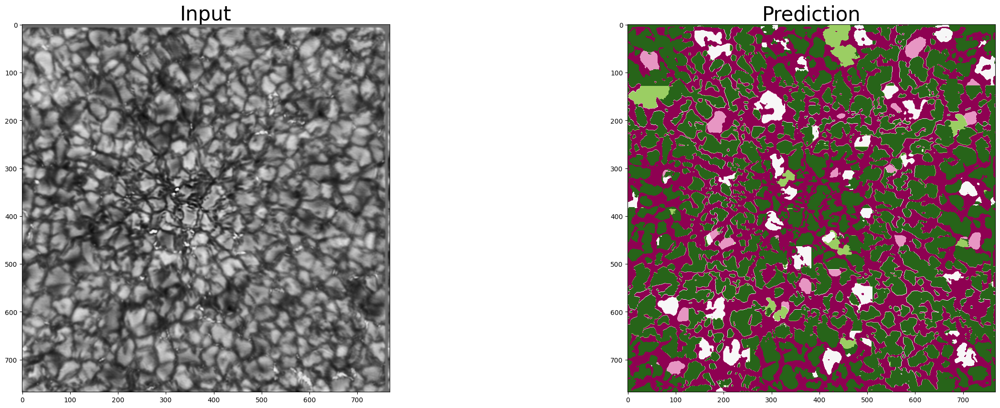

In [194]:
hdul = fits.open('/Users/reza/Career/DMLab/DKIST/data-subset/VBI_2022_05_26T18_06_41_906_00430500_I_AQKXV_L1..destr24-16.fits')
x = hdul[0].data.astype(np.float32)
x = x / x.max() * 255

img = Image.fromarray(x.astype(np.uint8))
img = img.resize((768, 768))
x = np.array(img, dtype=np.float32)

gy, gx = np.gradient(reference)
gy, gx = float(np.std(gy)), float(np.std(gx))

reference_mean, reference_stddev = cv2.meanStdDev(reference)

target_mean, target_stddev = cv2.meanStdDev(x)

reference_sharpness = np.var(filters.laplace(reference))
target_sharpness = np.var(filters.laplace(x))
sigma = np.sqrt(target_sharpness / reference_sharpness)

matched = filters.gaussian(x, sigma=sigma) # matched = cv2.GaussianBlur(x, (15, 15), 0)
matched = exposure.match_histograms(matched, reference)

x = matched / np.max(matched)



size = 128
dx=[]

for i in range(6):
    for j in range(6):
        dx.append(x[i*128:(i+1)*128, j*128:(j+1)*128])
dx=np.array(dx)
dx=np.expand_dims(dx, axis=1)
xx = torch.Tensor(dx)
model.eval()

with torch.no_grad():
    pred_mask = model(xx.to(device))
pred_mask_np = pred_mask.cpu().detach().numpy()
pred_mask_class = torch.argmax(pred_mask, axis=1)
pred_mask_class_np=pred_mask_class.cpu().detach().numpy()
yhat = np.zeros((768, 768), dtype=np.int32)

for i in range(6):
    for j in range(6):
        yhat[i*128:(i+1)*128, j*128:(j+1)*128] = pred_mask_class_np[i*6+j]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.title('Input', fontsize=30)
plt.imshow(x, cmap='gray')
plt.subplot(1, 2, 2)
plt.title('Prediction', fontsize=30)
plt.imshow(yhat, cmap=plt.get_cmap('PiYG', 5))

Value: 0.00, RGB: [142.   1.  82. 255.]
Value: 1.00, RGB: [231.5 150.5 196.  255. ]
Value: 2.00, RGB: [247. 247. 247. 255.]
Value: 3.00, RGB: [155.5 206.5  99.5 255. ]
Value: 4.00, RGB: [ 39. 100.  25. 255.]


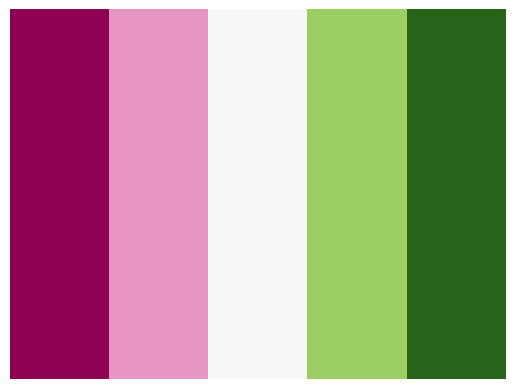

In [199]:
import matplotlib.pyplot as plt
import numpy as np

# Get a colormap (e.g., 'viridis')
cmap = plt.get_cmap('PiYG', 5)

# Number of colors you want to extract from the colormap
num_colors = 5

# Generate a range of values from 0 to 1
values = [0, 1, 2, 3, 4]

# Get the RGB values for each value
rgb_values = cmap(values)

# Display the RGB values
for i, rgb in enumerate(rgb_values):
    print(f'Value: {values[i]:.2f}, RGB: {rgb * 255}')

# Optionally, plot the colormap
plt.imshow([rgb_values], aspect='auto', cmap=cmap)
plt.axis('off')
plt.show()
